### Classification model for cluster 4

#### Importing the necessary libraries

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [11]:
dataset=pd.read_csv('output/predicted_cluster_4.csv')
dataset.head()

,Quick Assets/Total Assets,Equity to Liability,Cash/Total Assets,Total debt/Total net worth,Current Assets/Total Assets,Equity to Long-term Liability,Current Liabilities/Liability,Cash/Current Liability,Long-term Liability to Current Assets,Long-term fund suitability ratio (A),...,Cash Flow to Liability,PCA_ROA(C) before interest and depreciation before interest_ROA(A) before interest and % after tax,Total expense/Assets,Total income/Total expense,Cash Flow to Equity,Cash Flow to Total Assets,No-credit Interval,Interest Expense Ratio,Index,Bankrupt?
0,0.455587,0.515504,0.600249,8.697965e-09,0.533343,0.685198,0.318377,1.343546e-09,7.132593e-10,0.352848,...,0.609383,0.721382,0.358535,0.834455,0.543228,0.682741,0.585223,0.577442,2,0
1,0.508785,0.721019,0.794816,3.810747e-09,0.601386,0.672001,0.403198,4.044118e-09,2.634354e-10,0.343484,...,0.625037,0.739163,0.493361,0.828412,0.543348,0.700933,0.583124,0.577294,18,0
2,0.362248,0.560521,0.233239,7.323047e-09,0.404915,0.672809,0.428627,3.301788e-10,3.636397e-10,0.398055,...,0.597576,0.766888,0.236574,0.882505,0.536000,0.626266,0.584872,0.577322,33,0
3,0.354102,0.405651,0.405219,1.384687e-08,0.557877,0.689525,0.391008,4.849678e-10,6.987574e-10,0.350950,...,0.602637,0.643795,0.579601,0.797676,0.541479,0.659629,0.582410,0.578422,35,0
4,0.375342,0.489335,0.443793,9.644315e-09,0.415690,0.679047,0.505766,5.659029e-10,5.867733e-10,0.347640,...,0.600930,0.566952,0.374007,0.774220,0.538510,0.644116,0.582982,0.573042,38,0


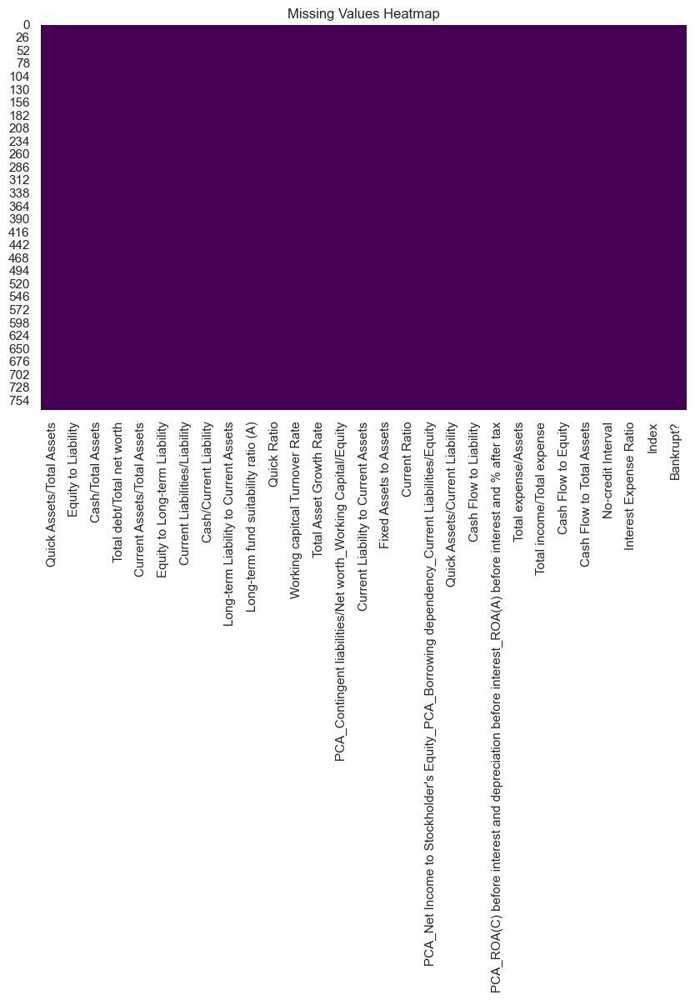

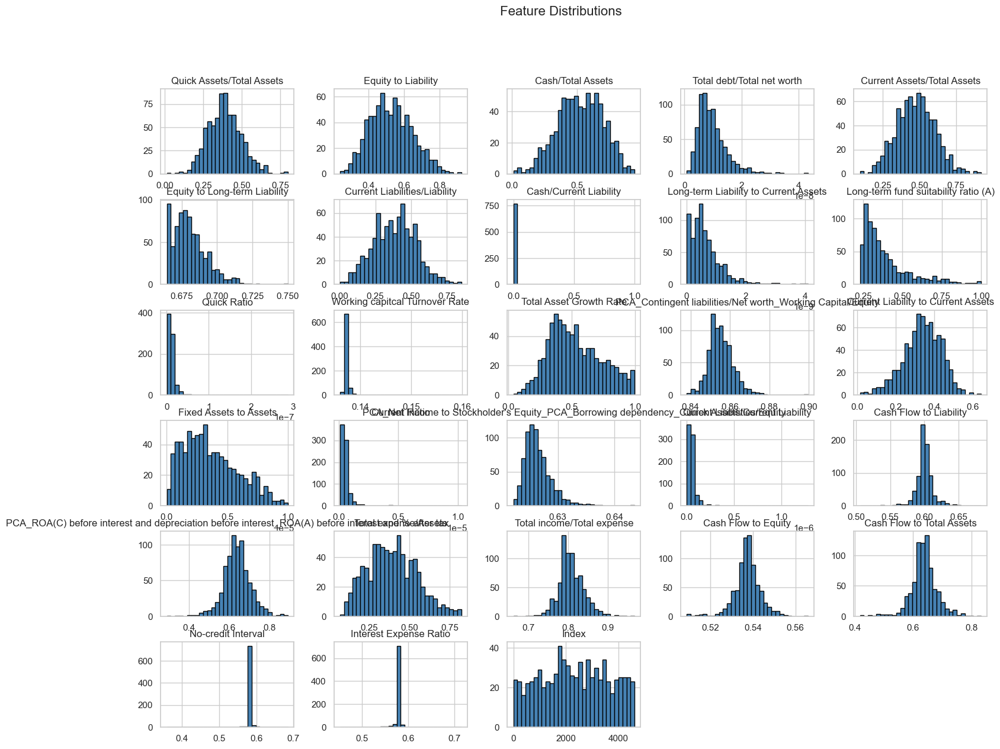

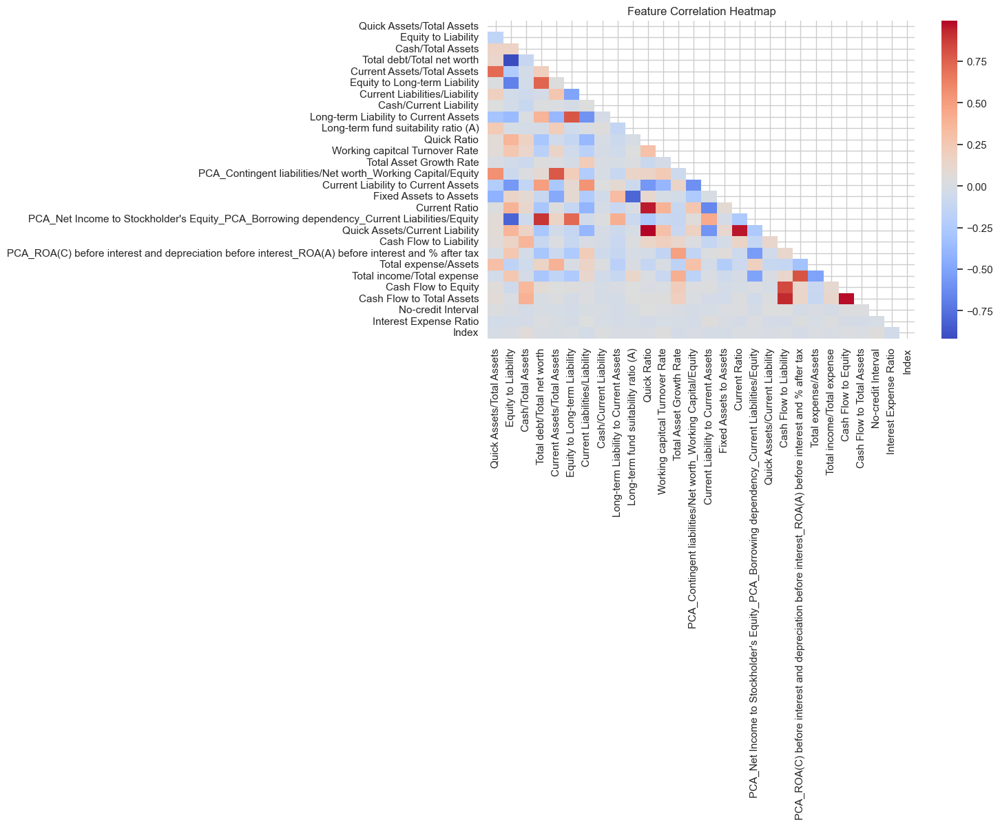

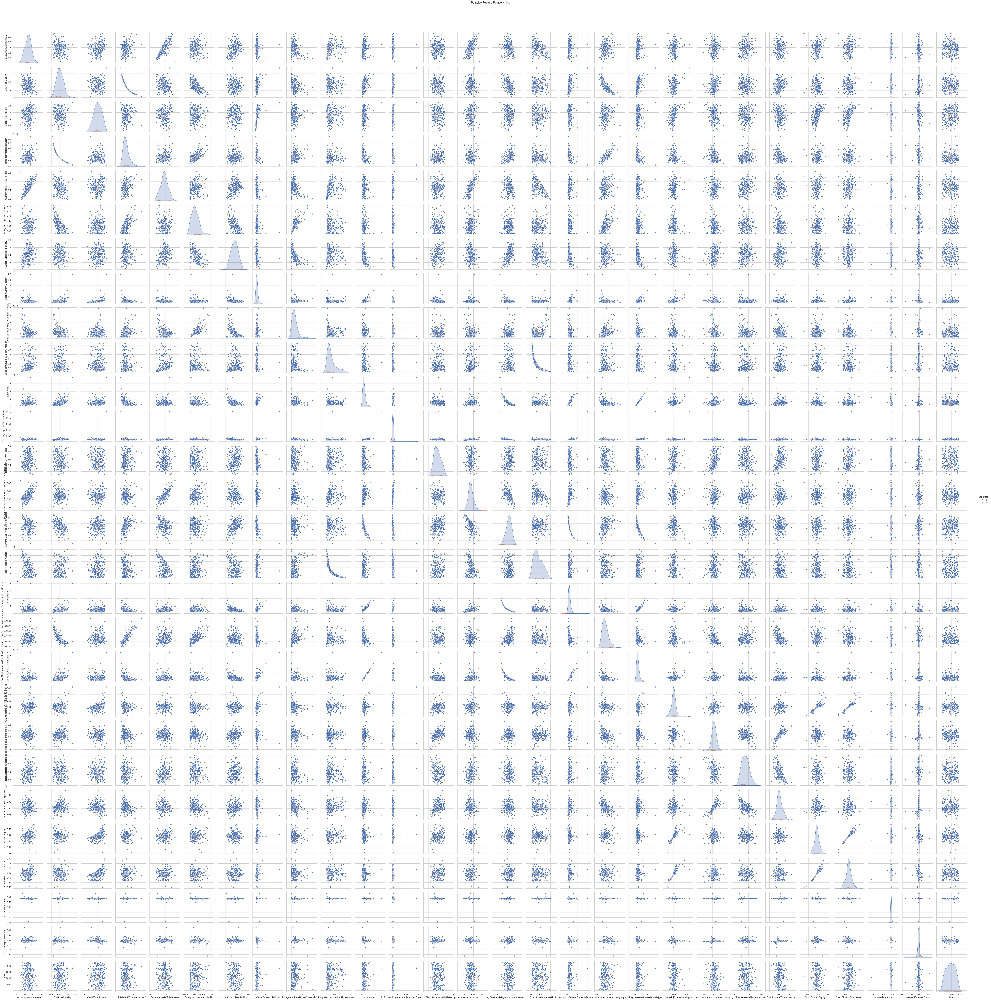

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot styles
sns.set(style='whitegrid')
plt.rcParams['figure.figsize'] = (10, 6)

# --- 1. Distribution of Target Column (assuming 'Bankrupt' is target) ---
if 'Bankrupt' in dataset.columns:
    sns.countplot(data=dataset, x='Bankrupt', palette='Set2')
    plt.title("Class Distribution")
    plt.xlabel("Bankrupt (0 = No, 1 = Yes)")
    plt.ylabel("Count")
    plt.show()

# --- 2. Missing Value Heatmap ---
sns.heatmap(dataset.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

# --- 3. Histograms for Numeric Features ---
numeric_cols = dataset.select_dtypes(include=['float64', 'int64']).columns.drop('Bankrupt?', errors='ignore')
dataset[numeric_cols].hist(bins=30, figsize=(18, 14), color='steelblue', edgecolor='black')
plt.suptitle("Feature Distributions", fontsize=16)
plt.show()

# --- 4. Boxplots by Target (only if target exists) ---
if 'Bankrupt' in dataset.columns:
    for col in numeric_cols[:6]:  # limit to first 6 for brevity
        sns.boxplot(data=dataset, x='Bankrupt', y=col, palette='coolwarm')
        plt.title(f'{col} vs Bankrupt')
        plt.show()

# --- 5. Correlation Heatmap ---
corr = dataset[numeric_cols].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

sns.heatmap(corr, mask=mask, annot=False, cmap='coolwarm', fmt='.2f')
plt.title("Feature Correlation Heatmap")
plt.show()

sns.pairplot(dataset.sample(200), hue='Bankrupt?', diag_kind='kde')  # sample for performance
plt.suptitle("Pairwise Feature Relationships", y=1.02)
plt.show()


In [13]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import joblib
from collections import defaultdict

def get_corr_pairs(df, threshold_low=0.85, threshold_high=0.95): # to get the collinear pairs
    corr_matrix = df.corr().abs()
    upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    drop_pairs, pca_pairs = [], []

    for row in upper_tri.index:
        for col in upper_tri.columns:
            corr = upper_tri.loc[row, col] 
            if pd.notna(corr):
                if corr > threshold_high:
                    drop_pairs.append((row, col, corr))
                elif corr > threshold_low:
                    pca_pairs.append((row, col, corr))

    drop_df = pd.DataFrame(drop_pairs, columns=["Feature_1", "Feature_2", "Correlation"])
    pca_df = pd.DataFrame(pca_pairs, columns=["Feature_1", "Feature_2", "Correlation"])
    return drop_df.sort_values(by='Correlation', ascending=False), pca_df.sort_values(by='Correlation', ascending=False)

def filter_unique_pairs(df_corr): #filtering out the unique pairs so to avoid performing pca with same features
    used, final = set(), []
    for _, row in df_corr.iterrows():
        f1, f2 = row['Feature_1'], row['Feature_2']
        if f1 not in used and f2 not in used:
            final.append(row)
            used.update([f1, f2])
    return pd.DataFrame(final)

def apply_drops(df, drop_df, tracked_drops): # dropping one of the feature columns if the collinearity is very high
    df_out = df.copy()
    for _, row in drop_df.iterrows():
        f1, f2 = row['Feature_1'], row['Feature_2']
        if f1 in df_out.columns and f2 in df_out.columns:
            tracked_drops.append(f2)
            df_out.drop(columns=[f2], inplace=True)
    return df_out

def apply_pca(df, pairs_df, pca_model_dict): # applying the pca
    df_out = df.copy()
    new_cols = []

    for _, row in pairs_df.iterrows():
        f1, f2 = row['Feature_1'], row['Feature_2']
        if f1 not in df_out.columns or f2 not in df_out.columns:
            continue

        subset = df_out[[f1, f2]].dropna()
        if subset.empty:
            continue

        data = subset.values - subset.values.mean(axis=0)
        pca = PCA(n_components=1).fit(data)
        key = f"{f1}__{f2}"
        pca_model_dict[key] = pca

        new_col = f"PCA_{f1}_{f2}"
        df_out[new_col] = np.nan
        df_out.loc[subset.index, new_col] = pca.transform(data).flatten()
        df_out.drop(columns=[f1, f2], inplace=True)
        new_cols.append(new_col)

    return df_out, new_cols

def hybrid_iterative_reduction(df, thresh_low=0.8, thresh_high=0.95, verbose=False): #doing the process of pca and dropping iteratively until no two features have collinearity higher than the lower threshold (0.8)
    df_iter = df.copy()
    iteration = 1
    all_pca_cols = []
    drop_track = []
    pca_model_dict = defaultdict(PCA)
    all_pca_pairs = []

    while True:
        drop_df, pca_df = get_corr_pairs(df_iter, threshold_low=thresh_low, threshold_high=thresh_high)
        if drop_df.empty and pca_df.empty:
            if verbose:
                print("No more correlated features to process.")
            break

        if verbose:
            print(f"\n--- Iteration {iteration} ---")
            if not drop_df.empty:
                print("Drop Pairs:")
                print(drop_df)
            if not pca_df.empty:
                print("PCA Pairs:")
                print(pca_df)

        if not drop_df.empty:
            df_iter = apply_drops(df_iter, drop_df, drop_track)

        if not pca_df.empty:
            unique_pca_df = filter_unique_pairs(pca_df)
            df_iter, new_pca_cols = apply_pca(df_iter, unique_pca_df, pca_model_dict)
            all_pca_pairs.append(unique_pca_df)
            all_pca_cols.extend(new_pca_cols)

        iteration += 1

    return df_iter.reset_index(drop=True), all_pca_cols, drop_track, pd.concat(all_pca_pairs, ignore_index=True), pca_model_dict


final_df, pca_features, dropped_cols, pca_pairs_df, pca_models = hybrid_iterative_reduction(
    dataset,
    thresh_low=0.8,
    thresh_high=0.95,
    verbose=True
)

import os
import joblib

# Ensure output directory exists
os.makedirs('output', exist_ok=True)

# Save all transformation metadata for test/inference
joblib.dump(dropped_cols, 'output/columns_to_drop.pkl')
joblib.dump(pca_pairs_df, 'output/pca_pairs_used.pkl')
joblib.dump(pca_models, 'output/fitted_pca_models.pkl')

print("\n✅ All PCA transformation artifacts saved.")


--- Iteration 1 ---
Drop Pairs:
             Feature_1                       Feature_2  Correlation
1          Quick Ratio  Quick Assets/Current Liability     0.995403
3  Cash Flow to Equity       Cash Flow to Total Assets     0.975534
2        Current Ratio  Quick Assets/Current Liability     0.964501
0          Quick Ratio                   Current Ratio     0.957125
PCA Pairs:
                              Feature_1  \
5                Cash Flow to Liability   
0                   Equity to Liability   
2            Total debt/Total net worth   
4                Cash Flow to Liability   
1                   Equity to Liability   
3  Long-term fund suitability ratio (A)   

                                           Feature_2  Correlation  
5                          Cash Flow to Total Assets     0.921838  
0                         Total debt/Total net worth     0.915933  
2  PCA_Net Income to Stockholder's Equity_PCA_Bor...     0.891216  
4                                Cash Flow

In [14]:
final_df.head()

,Quick Assets/Total Assets,Cash/Total Assets,Current Assets/Total Assets,Equity to Long-term Liability,Current Liabilities/Liability,Cash/Current Liability,Long-term Liability to Current Assets,Quick Ratio,Working capitcal Turnover Rate,Total Asset Growth Rate,...,PCA_ROA(C) before interest and depreciation before interest_ROA(A) before interest and % after tax,Total expense/Assets,Total income/Total expense,No-credit Interval,Interest Expense Ratio,Index,Bankrupt?,PCA_Long-term fund suitability ratio (A)_Fixed Assets to Assets,PCA_Cash Flow to Liability_Cash Flow to Equity,PCA_PCA_Net Income to Stockholder's Equity_PCA_Borrowing dependency_Current Liabilities/Equity_PCA_Equity to Liability_Total debt/Total net worth
0,0.455587,0.600249,0.533343,0.685198,0.318377,1.343546e-09,7.132593e-10,1.368394e-08,0.137345,0.927746,...,0.721382,0.358535,0.834455,0.585223,0.577442,2,0,-0.041570,0.011021,-0.011105
1,0.508785,0.794816,0.601386,0.672001,0.403198,4.044118e-09,2.634354e-10,2.109135e-08,0.137345,0.578797,...,0.739163,0.493361,0.828412,0.583124,0.577294,18,0,-0.050934,0.025394,0.194415
2,0.362248,0.233239,0.404915,0.672809,0.428627,3.301788e-10,3.636397e-10,9.700762e-09,0.137200,0.608533,...,0.766888,0.236574,0.882505,0.584872,0.577322,33,0,0.003636,-0.002698,0.033919
3,0.354102,0.405219,0.557877,0.689525,0.391008,4.849678e-10,6.987574e-10,6.630233e-09,0.137151,0.504027,...,0.643795,0.579601,0.797676,0.582410,0.578422,35,0,-0.043469,0.004143,-0.120993
4,0.375342,0.443793,0.415690,0.679047,0.505766,5.659029e-10,5.867733e-10,7.152938e-09,0.137020,0.353459,...,0.566952,0.374007,0.774220,0.582982,0.573042,38,0,-0.046778,0.001383,-0.037311


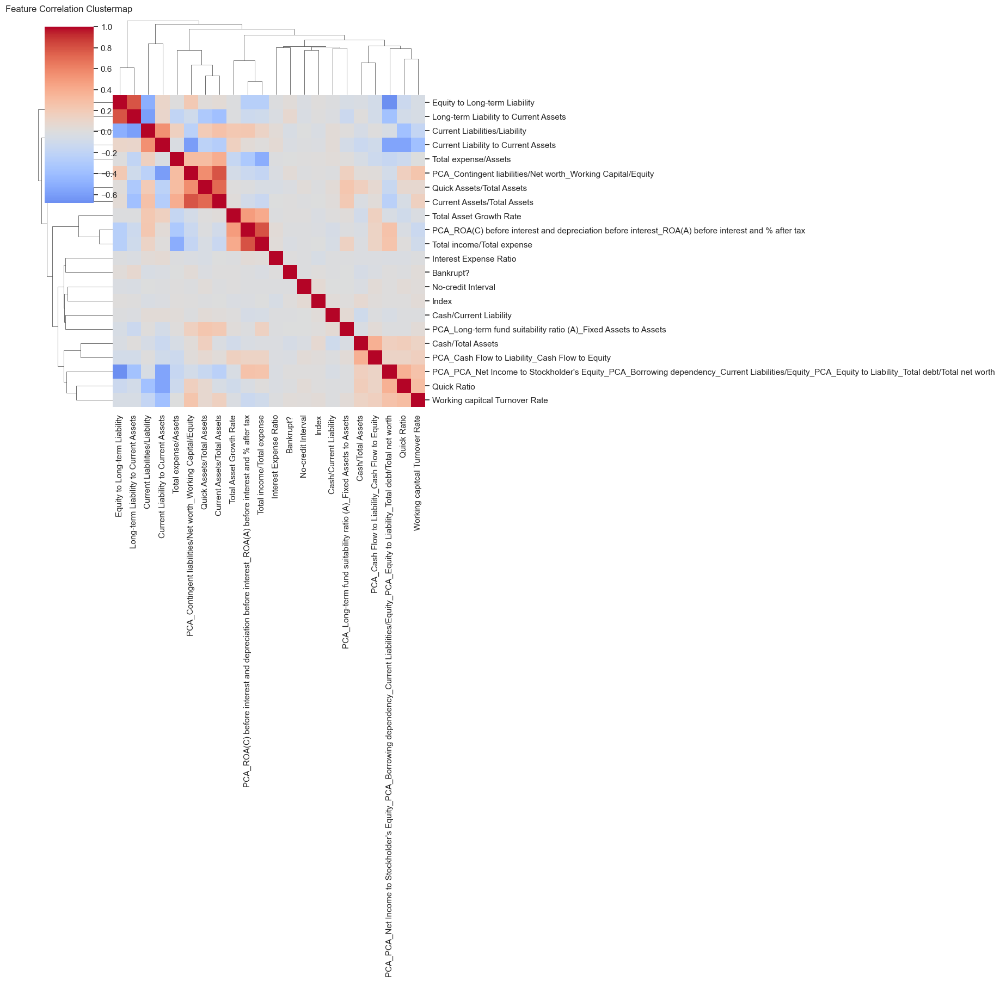

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

corr_matrix = final_df.corr()

sns.clustermap(corr_matrix, cmap="coolwarm", figsize=(18, 18), center=0, xticklabels=True, yticklabels=True)
plt.title("Feature Correlation Clustermap", pad=20)
plt.savefig("plots/correlation_heatmap_pca_applied.png", dpi=300, bbox_inches='tight')